# Dataset EDA

In [69]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the CSV file
df = pd.read_csv('Instagram Data.csv')

# Display the first few rows and basic information
print(df.head())
print(df.info())

# Check for missing values
print(df.isnull().sum())

# Display summary statistics
print(df.describe())

    likes  no_of_comments           t  follower_count_at_t  \
0  154552               0  1594174009             40934474   
1   97386               0  1593571666             40934474   
2  145632               0  1593136341             40934474   
3   76461               0  1592981047             40934474   
4  174620               0  1592703461             40934474   

                 image_path  
0  ../Data/insta_data/0.jpg  
1  ../Data/insta_data/2.jpg  
2  ../Data/insta_data/4.jpg  
3  ../Data/insta_data/6.jpg  
4  ../Data/insta_data/8.jpg  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3785 entries, 0 to 3784
Data columns (total 5 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   likes                3785 non-null   int64 
 1   no_of_comments       3785 non-null   int64 
 2   t                    3785 non-null   int64 
 3   follower_count_at_t  3785 non-null   int64 
 4   image_path           3785 non-null   objec

In [70]:
df

,likes,no_of_comments,t,follower_count_at_t,image_path
0,154552,0,1594174009,40934474,../Data/insta_data/0.jpg
1,97386,0,1593571666,40934474,../Data/insta_data/2.jpg
2,145632,0,1593136341,40934474,../Data/insta_data/4.jpg
3,76461,0,1592981047,40934474,../Data/insta_data/6.jpg
4,174620,0,1592703461,40934474,../Data/insta_data/8.jpg
...,...,...,...,...,...
3780,341895,6029,1555164674,4229627,../Data/insta_data/9435.jpg
3781,217095,2591,1554706282,4229627,../Data/insta_data/9436.jpg
3782,17902,253,1553945996,4229627,../Data/insta_data/9437.jpg
3783,141694,1175,1552645088,4229627,../Data/insta_data/9442.jpg


## Process images

In [71]:
import os
from PIL import Image
import numpy as np
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.preprocessing.image import img_to_array

# Function to load and preprocess images
def load_and_preprocess_image(image_path, target_size=(224, 224)):
    # Adjust the path to match the actual location
    adjusted_path = os.path.join('Interview Dec 2023', os.path.basename(image_path))
    img = Image.open(adjusted_path)
    img = img.resize(target_size)
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)
    return img_array

# Load pre-trained ResNet50 model
resnet_model = ResNet50(weights='imagenet', include_top=False, pooling='avg')

# Extract features from images
def extract_image_features(image_path):
    img_array = load_and_preprocess_image(image_path)
    features = resnet_model.predict(img_array)
    return features.flatten()

# Apply feature extraction to all images
df['image_features'] = df['image_path'].apply(extract_image_features)

# Display the updated dataframe
print(df.head())

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━

## Time features

In [73]:
# Assuming 'df' is your DataFrame and 't' is the column with Unix timestamps
df['post_datetime'] = pd.to_datetime(df['t'], unit='s')
df['post_month'] = df['post_datetime'].dt.month
df['post_day'] = df['post_datetime'].dt.day
df['post_hour'] = df['post_datetime'].dt.hour
df['post_dayofweek'] = df['post_datetime'].dt.dayofweek  # 0 is Monday, 6 is Sunday

In [74]:
# Is it a weekend?
df['is_weekend'] = df['post_dayofweek'].isin([5, 6]).astype(int)

# Is it evening? (assuming evening is 6 PM to 10 PM)
df['is_evening'] = ((df['post_hour'] >= 18) & (df['post_hour'] < 22)).astype(int)

# Seasonality
df['season'] = pd.cut(df['post_month'], bins=[0, 3, 6, 9, 12], labels=['Winter', 'Spring', 'Summer', 'Fall'])

In [75]:
df.head()

,likes,no_of_comments,t,follower_count_at_t,image_path,image_features,post_datetime,post_month,post_day,post_hour,post_dayofweek,is_weekend,is_evening,season
0,154552,0,1594174009,40934474,../Data/insta_data/0.jpg,"[1.2795631, 0.04748359, 0.21022694, 0.94680554...",2020-07-08 02:06:49,7,8,2,2,0,0,Summer
1,97386,0,1593571666,40934474,../Data/insta_data/2.jpg,"[0.6783186, 0.15825884, 0.65353394, 0.79477227...",2020-07-01 02:47:46,7,1,2,2,0,0,Summer
2,145632,0,1593136341,40934474,../Data/insta_data/4.jpg,"[0.12917899, 1.2136649, 0.6272233, 0.004950254...",2020-06-26 01:52:21,6,26,1,4,0,0,Spring
3,76461,0,1592981047,40934474,../Data/insta_data/6.jpg,"[0.61030173, 0.6226907, 0.47376272, 0.8425133,...",2020-06-24 06:44:07,6,24,6,2,0,0,Spring
4,174620,0,1592703461,40934474,../Data/insta_data/8.jpg,"[0.12614408, 0.014568086, 0.09146579, 0.154900...",2020-06-21 01:37:41,6,21,1,6,1,0,Spring


In [76]:
df.info()
# Comment engagement rate

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3785 entries, 0 to 3784
Data columns (total 14 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   likes                3785 non-null   int64         
 1   no_of_comments       3785 non-null   int64         
 2   t                    3785 non-null   int64         
 3   follower_count_at_t  3785 non-null   int64         
 4   image_path           3785 non-null   object        
 5   image_features       3785 non-null   object        
 6   post_datetime        3785 non-null   datetime64[ns]
 7   post_month           3785 non-null   int32         
 8   post_day             3785 non-null   int32         
 9   post_hour            3785 non-null   int32         
 10  post_dayofweek       3785 non-null   int32         
 11  is_weekend           3785 non-null   int64         
 12  is_evening           3785 non-null   int64         
 13  season               3785 non-nul

## addional features created

In [77]:
df['is_viral'] = (df['no_of_comments'] / df['follower_count_at_t'] > 0.5).astype(int)

In [78]:
df['is_viral'].value_counts()

is_viral
0    3720
1      65
Name: count, dtype: int64

In [79]:
df[df['is_viral'] > 0.5]
# Comment engagement rate

,likes,no_of_comments,t,follower_count_at_t,image_path,image_features,post_datetime,post_month,post_day,post_hour,post_dayofweek,is_weekend,is_evening,season,is_viral
3654,72539,256,1594530416,187,../Data/insta_data/9166.jpg,"[0.6935644, 0.7641195, 0.26457947, 0.93118566,...",2020-07-12 05:06:56,7,12,5,6,1,0,Summer,1
3656,64277,1330,1594474119,187,../Data/insta_data/9168.jpg,"[0.55267256, 2.3713727, 0.08432404, 0.81439215...",2020-07-11 13:28:39,7,11,13,5,1,0,Summer,1
3657,74184,432,1594467005,187,../Data/insta_data/9169.jpg,"[1.1719592, 0.5877685, 0.032624304, 0.10806684...",2020-07-11 11:30:05,7,11,11,5,1,0,Summer,1
3658,77374,491,1594444498,187,../Data/insta_data/9171.jpg,"[0.17382005, 1.8358011, 0.0, 1.8957243, 0.0037...",2020-07-11 05:14:58,7,11,5,5,1,0,Summer,1
3659,55321,137,1594436816,187,../Data/insta_data/9172.jpg,"[0.044532366, 1.2011372, 0.015716776, 0.457093...",2020-07-11 03:06:56,7,11,3,5,1,0,Summer,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3721,40253,113,1593090492,187,../Data/insta_data/9254.jpg,"[0.049950235, 1.6210327, 0.0, 0.5652714, 0.019...",2020-06-25 13:08:12,6,25,13,3,0,0,Spring,1
3722,102880,459,1593062852,187,../Data/insta_data/9257.jpg,"[0.15260243, 0.6685936, 0.00026912228, 1.63300...",2020-06-25 05:27:32,6,25,5,3,0,0,Spring,1
3723,52671,174,1593053104,187,../Data/insta_data/9258.jpg,"[0.58078456, 0.59796405, 0.05615322, 0.5177793...",2020-06-25 02:45:04,6,25,2,3,0,0,Spring,1
3724,91097,296,1593042565,187,../Data/insta_data/9259.jpg,"[0.12369724, 1.0321472, 0.11608849, 3.7826357,...",2020-06-24 23:49:25,6,24,23,2,0,0,Spring,1


In [80]:
# Comment engagement rate
df['comment_rate'] = df['no_of_comments'] / df['follower_count_at_t']

# Likes to comments ratio
df['likes_to_comments_ratio'] = df['likes'] / (df['no_of_comments'] + 1)  # Adding 1 to avoid division by zero

# Is it a viral post? (e.g., more than 1% of followers commented)
df['is_viral'] = (df['no_of_comments'] / df['follower_count_at_t'] > 100).astype(int)

In [81]:
df['no_of_comments'].describe()

count      3785.000000
mean       2531.382827
std       21064.081137
min           0.000000
25%         194.000000
50%         484.000000
75%        1337.000000
max      733973.000000
Name: no_of_comments, dtype: float64

In [82]:
df['is_viral'].value_counts()

is_viral
0    3785
Name: count, dtype: int64

In [83]:
df['follower_count_at_t'].describe()

count    3.785000e+03
mean     1.409485e+07
std      9.402605e+06
min      1.870000e+02
25%      7.296298e+06
50%      1.104970e+07
75%      1.836292e+07
max      4.093447e+07
Name: follower_count_at_t, dtype: float64

# Visualize the feature distribution 

In [84]:
df_corr = df.drop(columns = ['image_path'])
df_corr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3785 entries, 0 to 3784
Data columns (total 16 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   likes                    3785 non-null   int64         
 1   no_of_comments           3785 non-null   int64         
 2   t                        3785 non-null   int64         
 3   follower_count_at_t      3785 non-null   int64         
 4   image_features           3785 non-null   object        
 5   post_datetime            3785 non-null   datetime64[ns]
 6   post_month               3785 non-null   int32         
 7   post_day                 3785 non-null   int32         
 8   post_hour                3785 non-null   int32         
 9   post_dayofweek           3785 non-null   int32         
 10  is_weekend               3785 non-null   int64         
 11  is_evening               3785 non-null   int64         
 12  season                   3785 non-

In [85]:
df_corr = df[['likes', 'no_of_comments', 'follower_count_at_t', 'comment_rate', 'likes_to_comments_ratio', 'is_viral']]

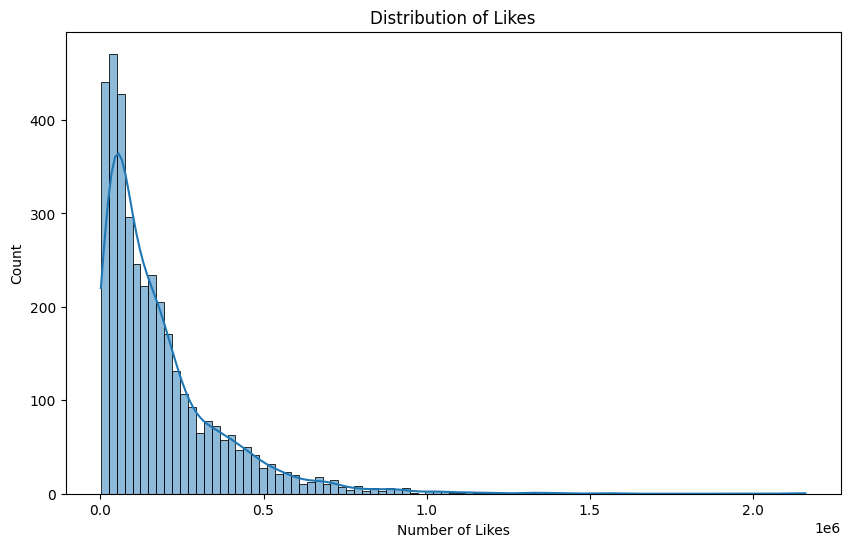

In [86]:
# Visualize the distribution of likes
plt.figure(figsize=(10, 6))
sns.histplot(df['likes'], kde=True)
plt.title('Distribution of Likes')
plt.xlabel('Number of Likes')
plt.show()

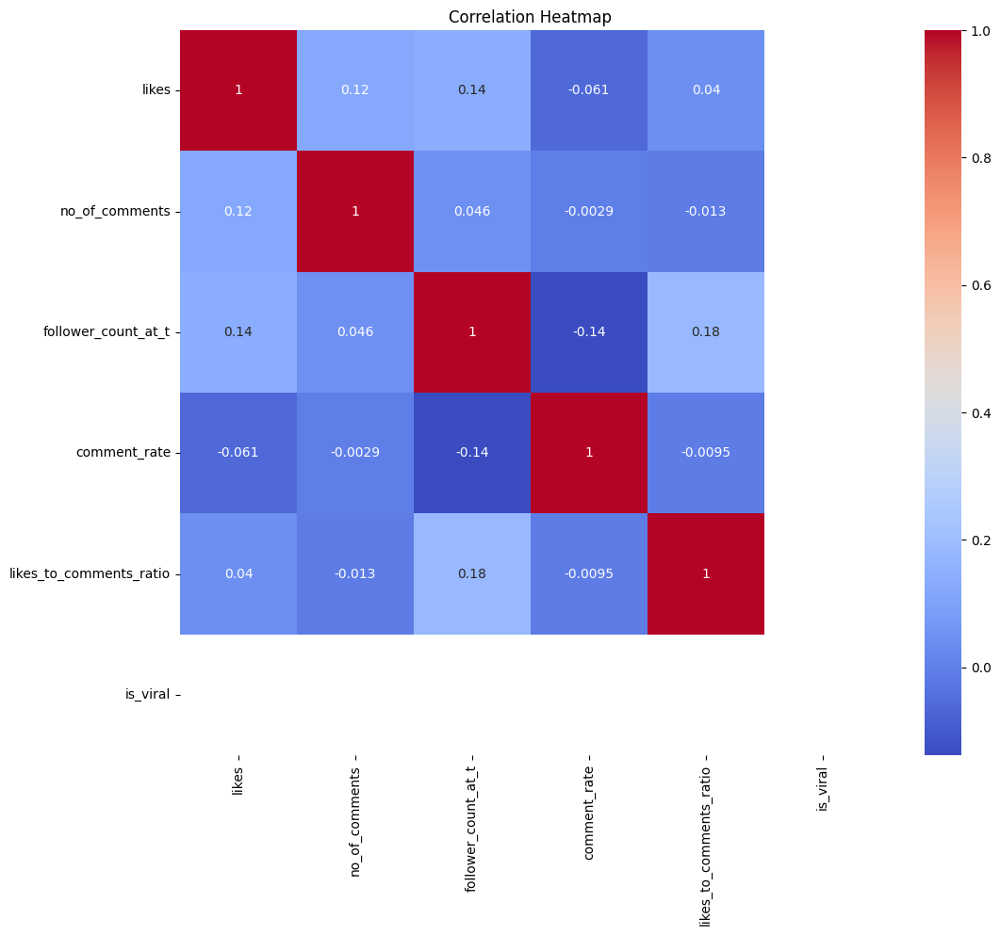

                            likes  no_of_comments  follower_count_at_t  \
likes                    1.000000        0.120402             0.138976   
no_of_comments           0.120402        1.000000             0.045993   
follower_count_at_t      0.138976        0.045993             1.000000   
comment_rate            -0.061008       -0.002879            -0.138168   
likes_to_comments_ratio  0.040359       -0.012698             0.184393   
is_viral                      NaN             NaN                  NaN   

                         comment_rate  likes_to_comments_ratio  is_viral  
likes                       -0.061008                 0.040359       NaN  
no_of_comments              -0.002879                -0.012698       NaN  
follower_count_at_t         -0.138168                 0.184393       NaN  
comment_rate                 1.000000                -0.009543       NaN  
likes_to_comments_ratio     -0.009543                 1.000000       NaN  
is_viral                       

In [87]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Select the columns for correlation analysis
df_corr = df[['likes', 'no_of_comments', 'follower_count_at_t', 'comment_rate', 'likes_to_comments_ratio', 'is_viral']]

# Correlation matrix
correlation_matrix = df_corr.corr()

# Plot the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

# Print the correlation matrix
print(correlation_matrix)

   follower_count_at_t   likes     likes_mean  likes_vs_user_avg  is_top_post
0             40934474  154552  159005.710526           0.971990            0
1             40934474   97386  159005.710526           0.612469            0
2             40934474  145632  159005.710526           0.915892            0
3             40934474   76461  159005.710526           0.480870            0
4             40934474  174620  159005.710526           1.098200            0
5             40934474  160101  159005.710526           1.006888            0
6             40934474  117820  159005.710526           0.740980            0
7             40934474  205728  159005.710526           1.293840            0
8             40934474  350579  159005.710526           2.204820            0
9             40934474  198168  159005.710526           1.246295            0

Summary statistics for new features:
       likes_vs_user_avg  comments_vs_user_avg  is_top_post
count        3785.000000           3747.0000

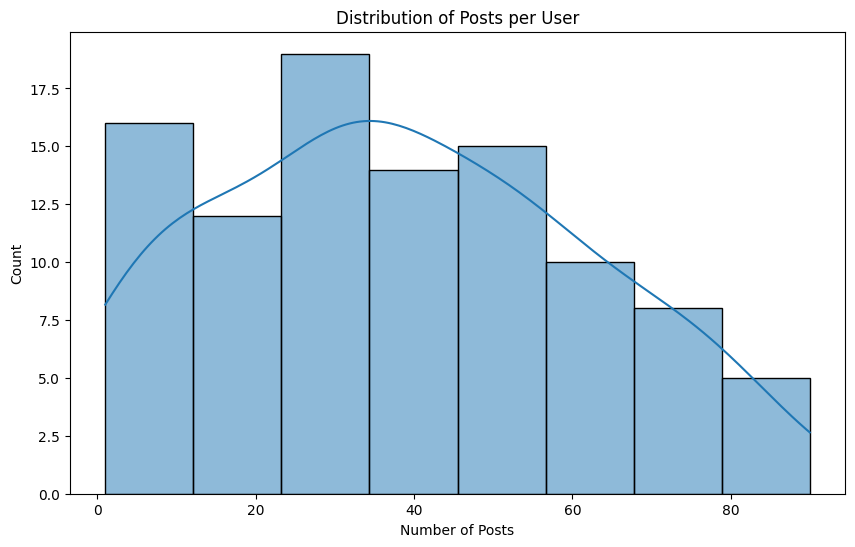

In [88]:
import pandas as pd
import numpy as np

# Group by follower count and calculate various metrics
user_post_analysis = df.groupby('follower_count_at_t').agg({
    'likes': ['count', 'mean', 'median', 'std', 'min', 'max'],
    'no_of_comments': ['mean', 'median', 'std'],
    't': ['min', 'max']  # to get the first and last post time for each user
})

# Flatten the column names
user_post_analysis.columns = ['_'.join(col).strip() for col in user_post_analysis.columns.values]

# Calculate additional metrics
user_post_analysis['likes_range'] = user_post_analysis['likes_max'] - user_post_analysis['likes_min']
user_post_analysis['likes_coefficient_of_variation'] = user_post_analysis['likes_std'] / user_post_analysis['likes_mean']
user_post_analysis['post_timespan_days'] = (user_post_analysis['t_max'] - user_post_analysis['t_min']) / (24 * 3600)  # Convert seconds to days

# Merge these metrics back to the original dataframe
df = df.merge(user_post_analysis, left_on='follower_count_at_t', right_index=True, suffixes=('', '_user_avg'))

# Calculate how each post performs relative to the user's average
df['likes_vs_user_avg'] = df['likes'] / df['likes_mean']
df['comments_vs_user_avg'] = df['no_of_comments'] / df['no_of_comments_mean']

# Identify top performing posts for each user
df['is_top_post'] = df.groupby('follower_count_at_t')['likes'].transform(lambda x: x == x.max()).astype(int)

# Display the first few rows of the updated dataframe
print(df[['follower_count_at_t', 'likes', 'likes_mean', 'likes_vs_user_avg', 'is_top_post']].head(10))

# Summary statistics for the new features
print("\nSummary statistics for new features:")
print(df[['likes_vs_user_avg', 'comments_vs_user_avg', 'is_top_post']].describe())

# Distribution of posts per user
posts_per_user = df.groupby('follower_count_at_t').size()
print("\nDistribution of posts per user:")
print(posts_per_user.describe())

# Users with the most variable like counts
most_variable_users = user_post_analysis.sort_values('likes_coefficient_of_variation', ascending=False).head(10)
print("\nTop 10 users with most variable like counts:")
print(most_variable_users[['likes_count', 'likes_mean', 'likes_std', 'likes_coefficient_of_variation']])

# Visualize the distribution of posts per user
plt.figure(figsize=(10, 6))
sns.histplot(posts_per_user, kde=True)
plt.title('Distribution of Posts per User')
plt.xlabel('Number of Posts')
plt.show()



In [89]:
user_post_analysis

,likes_count,likes_mean,likes_median,likes_std,likes_min,likes_max,no_of_comments_mean,no_of_comments_median,no_of_comments_std,t_min,t_max,likes_range,likes_coefficient_of_variation,post_timespan_days
follower_count_at_t,,,,,,,,,,,,,,
187,72,55772.861111,54314.5,20645.798623,15673,112827,405.680556,225.0,459.395433,1593004229,1594530416,97154,0.370176,17.664201
4229627,41,170393.878049,112555.0,147407.102935,10381,616456,2426.048780,1126.0,3099.175543,1551937608,1593405282,606075,0.865096,479.949931
4672789,18,62723.055556,31287.5,58848.172239,9010,172989,283.666667,90.5,396.396266,1593104451,1594342822,163979,0.938222,14.332998
4757512,10,256694.000000,219159.5,114605.737516,144928,492605,4845.900000,5307.0,2175.711912,1576681553,1592577672,347677,0.446468,183.982859
4825675,74,248397.405405,235905.5,117002.229455,14617,555781,1574.918919,1152.0,1442.197683,1583029475,1594175213,541164,0.471028,129.001597
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35860886,51,143217.764706,138373.0,73543.987664,15772,353561,1387.666667,1157.0,888.712477,1582972146,1594350542,337789,0.513512,131.694398
37229501,34,113134.000000,86143.0,77734.291488,25460,287985,42161.441176,437.5,134396.151045,1590145319,1594357348,262525,0.687099,48.750336
37729625,10,141142.600000,110504.0,98367.366271,32696,334749,459.600000,421.0,505.874644,1576233941,1592887285,302053,0.696936,192.747037


In [90]:
# Saving the dataframe
df.to_csv('Instagram Data with Features.csv', index=False)
# XGBRegressor model

# XGBRegressor model

## Baseline Model

/var/folders/jn/r_l7wtpj3lv2y53bg2bflm040000gn/T/ipykernel_1492/3145205093.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[image_features] = df['image_features'].apply(pd.Series)
/var/folders/jn/r_l7wtpj3lv2y53bg2bflm040000gn/T/ipykernel_1492/3145205093.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[image_features] = df['image_features'].apply(pd.Series)
/var/folders/jn/r_l7wtpj3lv2y53bg2bflm040000gn/T/ipykernel_1492/3145205093.py:25: PerformanceWarning: DataFrame is highly fragmented.  This is usually the resul

Root Mean Squared Error: 97759.94945492478
R-squared Score: 0.7191838026046753


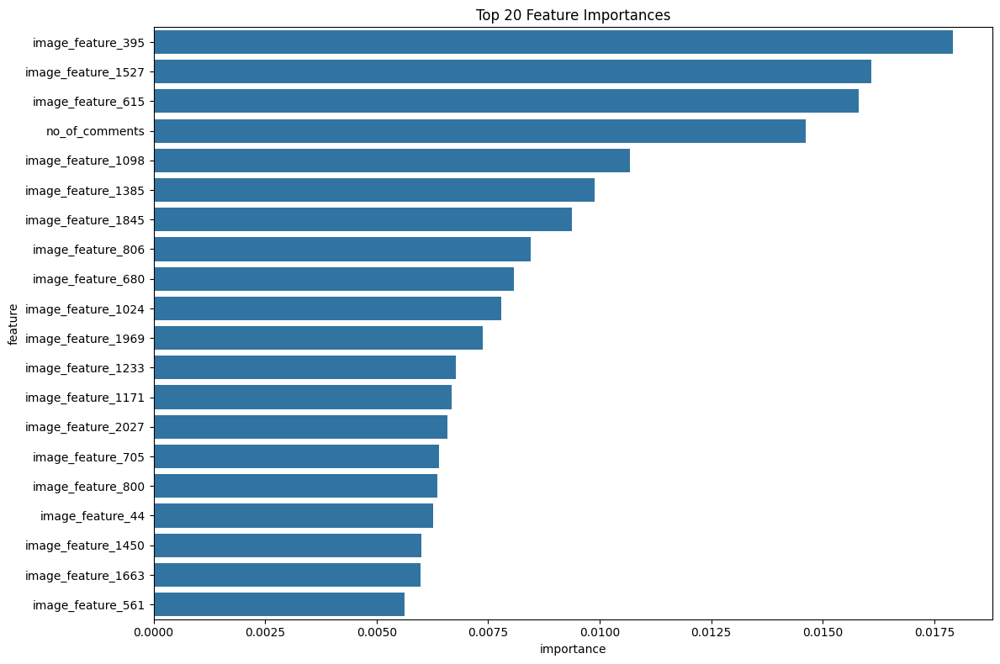

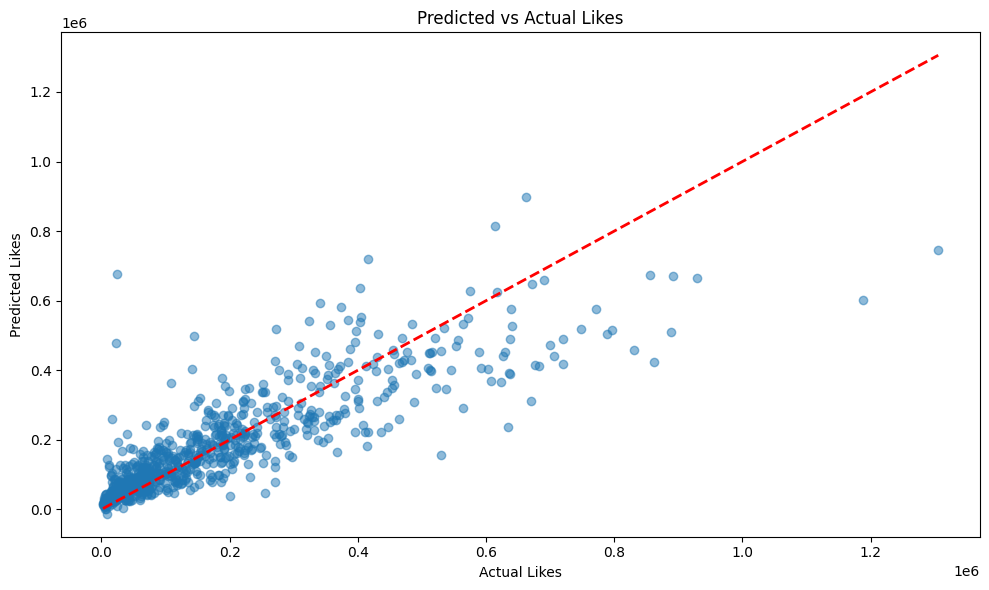

In [91]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
from xgboost import XGBRegressor
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Data preparation
# Assuming df is your DataFrame with all the features we've created so far

# 2. Feature engineering
# Let's create a few more features that might be useful

df['log_follower_count'] = np.log1p(df['follower_count_at_t'])

# Select features for the model
features = ['no_of_comments', 'follower_count_at_t', 'post_hour', 'post_dayofweek',
            'is_weekend', 'is_evening', 'comment_rate',
            'is_viral', 'log_follower_count']

# Add image features
image_features = [f'image_feature_{i}' for i in range(len(df['image_features'].iloc[0]))]
df[image_features] = df['image_features'].apply(pd.Series)
features.extend(image_features)

X = df[features]
y = df['likes']

# 3. Splitting the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 4. Model training
model = XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
model.fit(X_train_scaled, y_train)

# 5. Model evaluation
y_pred = model.predict(X_test_scaled)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print(f"Root Mean Squared Error: {rmse}")
print(f"R-squared Score: {r2}")

# 6. Feature importance analysis
feature_importance = model.feature_importances_
feature_importance_df = pd.DataFrame({'feature': features, 'importance': feature_importance})
feature_importance_df = feature_importance_df.sort_values('importance', ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(x='importance', y='feature', data=feature_importance_df.head(20))
plt.title('Top 20 Feature Importances')
plt.tight_layout()
plt.show()

# Scatter plot of predicted vs actual likes
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.xlabel('Actual Likes')
plt.ylabel('Predicted Likes')
plt.title('Predicted vs Actual Likes')
plt.tight_layout()
plt.show()

## ## Hyperparameter Tuning

In [92]:
# Define the parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

# Initialize the model
xgb_model = XGBRegressor(random_state=42)

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=3, scoring='neg_mean_squared_error', verbose=1, n_jobs=-1)

# Fit GridSearchCV
grid_search.fit(X_train_scaled, y_train)

# Get the best parameters
best_params = grid_search.best_params_
print(f"Best parameters: {best_params}")

# Train the model with the best parameters
best_model = XGBRegressor(**best_params, random_state=42)
best_model.fit(X_train_scaled, y_train)

# Evaluate the best model
y_pred_best = best_model.predict(X_test_scaled)
mse_best = mean_squared_error(y_test, y_pred_best)
rmse_best = np.sqrt(mse_best)
r2_best = r2_score(y_test, y_pred_best)

print(f"Best Model Root Mean Squared Error: {rmse_best}")
print(f"Best Model R-squared Score: {r2_best}")

Fitting 3 folds for each of 108 candidates, totalling 324 fits


KeyboardInterrupt: 

In [93]:
print(df['likes'].describe())

count    3.785000e+03
mean     1.832536e+05
std      1.936969e+05
min      1.431000e+03
25%      5.208700e+04
50%      1.236640e+05
75%      2.431440e+05
max      2.161369e+06
Name: likes, dtype: float64


In [94]:
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_best, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.xlabel('Actual Likes')
plt.ylabel('Predicted Likes')
plt.title('Predicted vs Actual Likes (Best Model)')
plt.tight_layout()
plt.show()

NameError: name 'y_pred_best' is not defined

<Figure size 1000x600 with 0 Axes>

## Testing the model with new data points

In [95]:
import warnings
from pandas.errors import PerformanceWarning

# Suppress the specific PerformanceWarning
warnings.filterwarnings("ignore", category=PerformanceWarning, message="DataFrame is highly fragmented")

# Assuming you have a new post with features
new_post = {
    'no_of_comments': 1000,
    'follower_count_at_t': 50000,
    'post_hour': 14,
    'post_dayofweek': 2,
    'is_weekend': 1,
    'is_evening': 0,
    'comment_rate': 0.002,
    'is_viral': 1,
    'log_follower_count': np.log1p(50000)
}

# Convert the dictionary to a DataFrame
new_post_df = pd.DataFrame([new_post])

# Make sure to include any feature engineering steps you did during training
new_post_df['log_follower_count'] = np.log1p(new_post_df['follower_count_at_t'])

# If you used image features, you'd need to include those as well
# This is just a placeholder - replace with actual image features
image_features = [0] * 2048  # Assuming 2048 image features from ResNet50
for i, value in enumerate(image_features):
    new_post_df[f'image_feature_{i}'] = value

# Make sure the new_post_df has all the columns in the same order as X_train
new_post_df = new_post_df[X.columns]

# Scale the features
new_post_scaled = scaler.transform(new_post_df)

# Make the prediction
predicted_likes = model.predict(new_post_scaled)

print(f"Predicted number of likes for the new post: {predicted_likes[0]:.0f}")

Predicted number of likes for the new post: 179748


In [96]:
df.head()

,likes,no_of_comments,t,follower_count_at_t,image_path,image_features,post_datetime,post_month,post_day,post_hour,...,image_feature_2038,image_feature_2039,image_feature_2040,image_feature_2041,image_feature_2042,image_feature_2043,image_feature_2044,image_feature_2045,image_feature_2046,image_feature_2047
0,154552,0,1594174009,40934474,../Data/insta_data/0.jpg,"[1.2795631, 0.04748359, 0.21022694, 0.94680554...",2020-07-08 02:06:49,7,8,2,...,1.136727,0.000000,1.402874,0.261462,0.384964,0.065630,0.121107,3.307942,1.102947,0.185562
1,97386,0,1593571666,40934474,../Data/insta_data/2.jpg,"[0.6783186, 0.15825884, 0.65353394, 0.79477227...",2020-07-01 02:47:46,7,1,2,...,0.421158,0.058326,0.494414,1.392659,0.629553,0.151959,0.110071,1.414775,1.351197,0.317370
2,145632,0,1593136341,40934474,../Data/insta_data/4.jpg,"[0.12917899, 1.2136649, 0.6272233, 0.004950254...",2020-06-26 01:52:21,6,26,1,...,0.504970,0.046586,0.067683,1.435768,1.105197,0.201705,1.414052,0.164851,0.103339,0.271184
3,76461,0,1592981047,40934474,../Data/insta_data/6.jpg,"[0.61030173, 0.6226907, 0.47376272, 0.8425133,...",2020-06-24 06:44:07,6,24,6,...,0.002939,0.348232,0.361425,0.070693,0.464200,0.237739,0.944762,0.225173,0.759537,0.830513
4,174620,0,1592703461,40934474,../Data/insta_data/8.jpg,"[0.12614408, 0.014568086, 0.09146579, 0.154900...",2020-06-21 01:37:41,6,21,1,...,0.000000,0.427955,0.280379,0.969149,1.038844,0.004350,0.663179,0.043741,0.153396,0.248866


# Classification model

## Baseline model

Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.78      0.81       255
           1       0.63      0.65      0.64       247
           2       0.79      0.82      0.80       255

    accuracy                           0.75       757
   macro avg       0.75      0.75      0.75       757
weighted avg       0.75      0.75      0.75       757



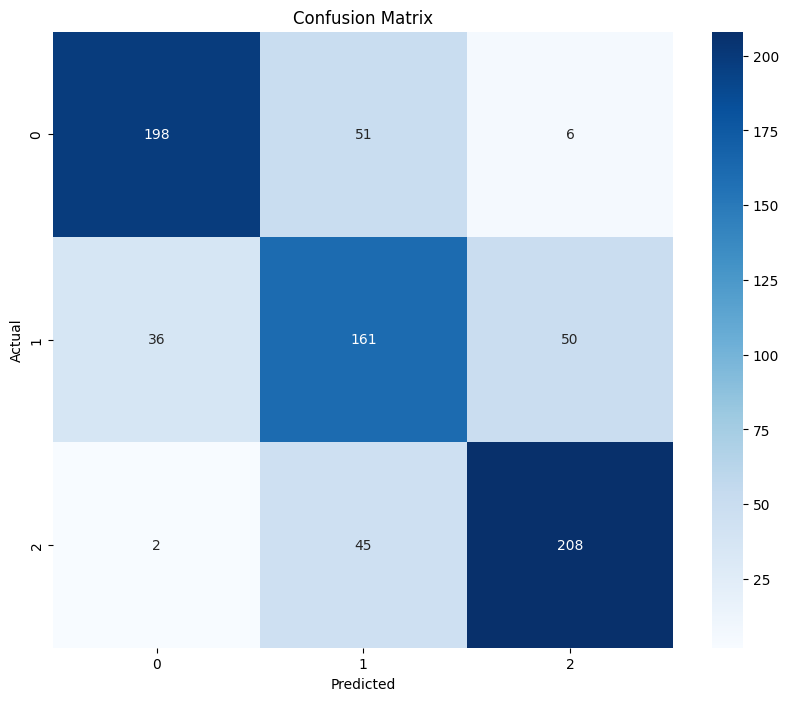

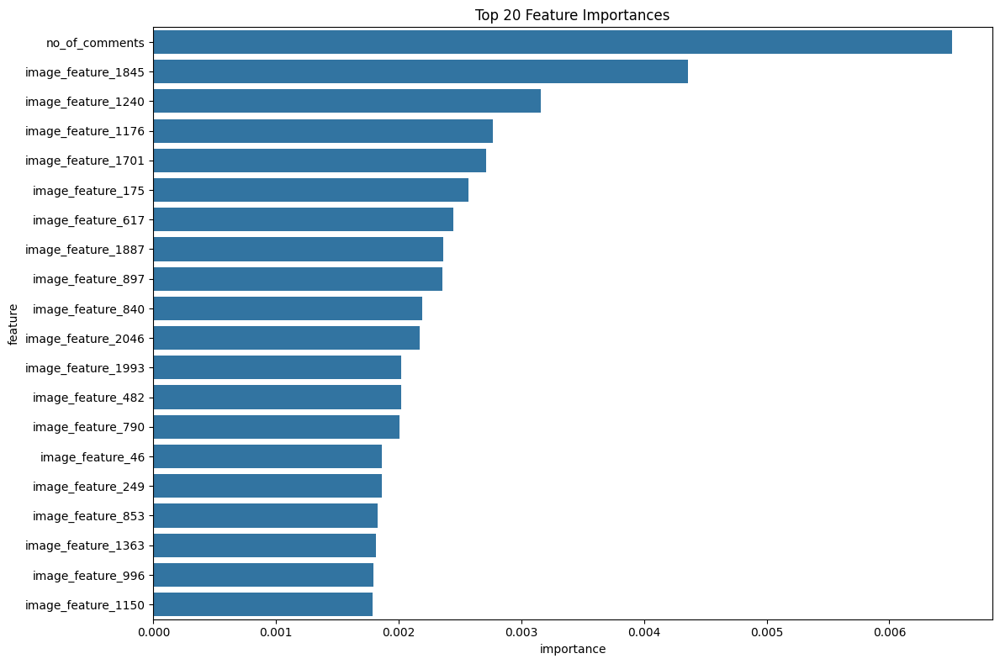

In [97]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df is your DataFrame with all the features

# 1. Feature engineering (as before)
df['log_follower_count'] = np.log1p(df['follower_count_at_t'])

# 2. Create the target classes
def categorize_likes(likes):
    if likes <= df['likes'].quantile(0.33):
        return 0  # Low likes
    elif likes <= df['likes'].quantile(0.67):
        return 1  # Medium likes
    else:
        return 2  # High likes

df['like_category'] = df['likes'].apply(categorize_likes)

# 3. Select features for the model
features = ['no_of_comments', 'follower_count_at_t', 'post_hour', 'post_dayofweek',
            'is_weekend', 'is_evening', 'comment_rate',
            'is_viral', 'log_follower_count']

# Add image features
image_features = [f'image_feature_{i}' for i in range(len(df['image_features'].iloc[0]))]
df[image_features] = df['image_features'].apply(pd.Series)
features.extend(image_features)

X = df[features]
y = df['like_category']

# 4. Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 5. Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 6. Train the model
model = XGBClassifier(n_estimators=100, learning_rate=0.1, random_state=42)
model.fit(X_train_scaled, y_train)

# 7. Make predictions
y_pred = model.predict(X_test_scaled)

# 8. Evaluate the model
print("Classification Report:")
print(classification_report(y_test, y_pred))

# 9. Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# 10. Feature importance analysis
feature_importance = model.feature_importances_
feature_importance_df = pd.DataFrame({'feature': features, 'importance': feature_importance})
feature_importance_df = feature_importance_df.sort_values('importance', ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(x='importance', y='feature', data=feature_importance_df.head(20))
plt.title('Top 20 Feature Importances')
plt.tight_layout()
plt.show()

## Hyperparameter Tuning

In [98]:
''''
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report, confusion_matrix
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
import seaborn as sns


# 1. Feature engineering (as before)
df['log_follower_count'] = np.log1p(df['follower_count_at_t'])

# 2. Create the target classes
def categorize_likes(likes):
    if likes <= df['likes'].quantile(0.33):
        return 0  # Low likes
    elif likes <= df['likes'].quantile(0.67):
        return 1  # Medium likes
    else:
        return 2  # High likes

df['like_category'] = df['likes'].apply(categorize_likes)

# 3. Select features for the model
features = ['no_of_comments', 'follower_count_at_t', 'post_hour', 'post_dayofweek',
            'is_weekend', 'is_evening', 'comment_rate',
            'is_viral', 'log_follower_count']

# Add image features
image_features = [f'image_feature_{i}' for i in range(len(df['image_features'].iloc[0]))]
df[image_features] = df['image_features'].apply(pd.Series)
features.extend(image_features)

X = df[features]
y = df['like_category']


# 4. Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# 5. Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 6. Define parameter grid for GridSearchCV
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 4, 5, 6],
    'learning_rate': [0.01, 0.1, 0.3],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

# 7. Perform GridSearchCV
model = XGBClassifier(random_state=42)
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, 
                           cv=3, n_jobs=-1, verbose=2, scoring='accuracy')
grid_search.fit(X_train_scaled, y_train)

# 8. Print best parameters and score
print("Best parameters found: ", grid_search.best_params_)
print("Best cross-validation score: {:.2f}".format(grid_search.best_score_))

# 9. Use best model for predictions
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test_scaled)

# 10. Evaluate the model
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# 11. Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# 12. Feature importance analysis
feature_importance = best_model.feature_importances_
feature_importance_df = pd.DataFrame({'feature': features, 'importance': feature_importance})
feature_importance_df = feature_importance_df.sort_values('importance', ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(x='importance', y='feature', data=feature_importance_df.head(20))
plt.title('Top 20 Feature Importances (Best Model)')
plt.tight_layout()
plt.show()
'''

'\'\nimport pandas as pd\nimport numpy as np\nfrom sklearn.model_selection import train_test_split, GridSearchCV\nfrom sklearn.preprocessing import StandardScaler\nfrom sklearn.metrics import classification_report, confusion_matrix\nfrom xgboost import XGBClassifier\nimport matplotlib.pyplot as plt\nimport seaborn as sns\n\n\n# 1. Feature engineering (as before)\ndf[\'log_follower_count\'] = np.log1p(df[\'follower_count_at_t\'])\n\n# 2. Create the target classes\ndef categorize_likes(likes):\n    if likes <= df[\'likes\'].quantile(0.33):\n        return 0  # Low likes\n    elif likes <= df[\'likes\'].quantile(0.67):\n        return 1  # Medium likes\n    else:\n        return 2  # High likes\n\ndf[\'like_category\'] = df[\'likes\'].apply(categorize_likes)\n\n# 3. Select features for the model\nfeatures = [\'no_of_comments\', \'follower_count_at_t\', \'post_hour\', \'post_dayofweek\',\n            \'is_weekend\', \'is_evening\', \'comment_rate\',\n            \'is_viral\', \'log_followe

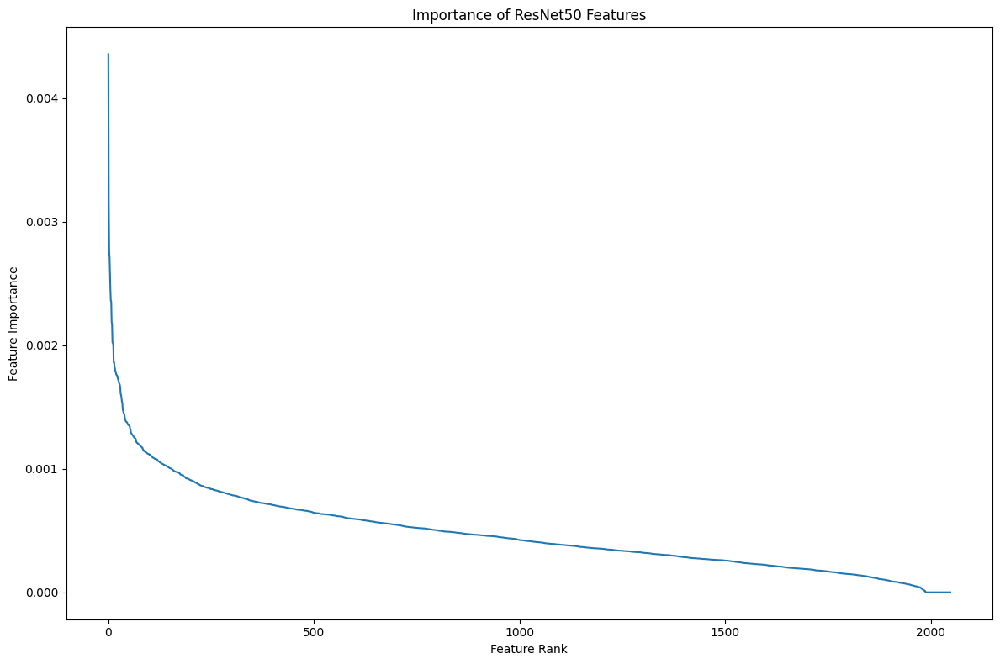

Feature 1845: 0.0043581221252679825
Feature 1240: 0.0031550314743071795
Feature 1176: 0.002764401026070118
Feature 1701: 0.002710374305024743
Feature 175: 0.0025683091953396797
Feature 617: 0.002447661245241761
Feature 1887: 0.002361161168664694
Feature 897: 0.0023548288736492395
Feature 840: 0.002192383399233222
Feature 2046: 0.0021690891589969397
Feature 1993: 0.0020234377589076757
Feature 482: 0.0020185450557619333
Feature 790: 0.002006063237786293
Feature 46: 0.0018613761058077216
Feature 249: 0.0018612133571878076
Feature 853: 0.0018280120566487312
Feature 1363: 0.0018127948278561234
Feature 996: 0.0017934624338522553
Feature 1150: 0.0017852693563327193
Feature 1065: 0.0017643501050770283


In [99]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'model' is your trained XGBoost model
feature_importance = model.feature_importances_
image_feature_importance = feature_importance[-2048:]  # ResNet50 outputs 2048 features

plt.figure(figsize=(12, 8))
plt.plot(range(2048), sorted(image_feature_importance, reverse=True))
plt.title('Importance of ResNet50 Features')
plt.xlabel('Feature Rank')
plt.ylabel('Feature Importance')
plt.tight_layout()
plt.show()

# Top 20 most important features
top_20_features = sorted(enumerate(image_feature_importance), key=lambda x: x[1], reverse=True)[:20]
for idx, importance in top_20_features:
    print(f"Feature {idx}: {importance}")

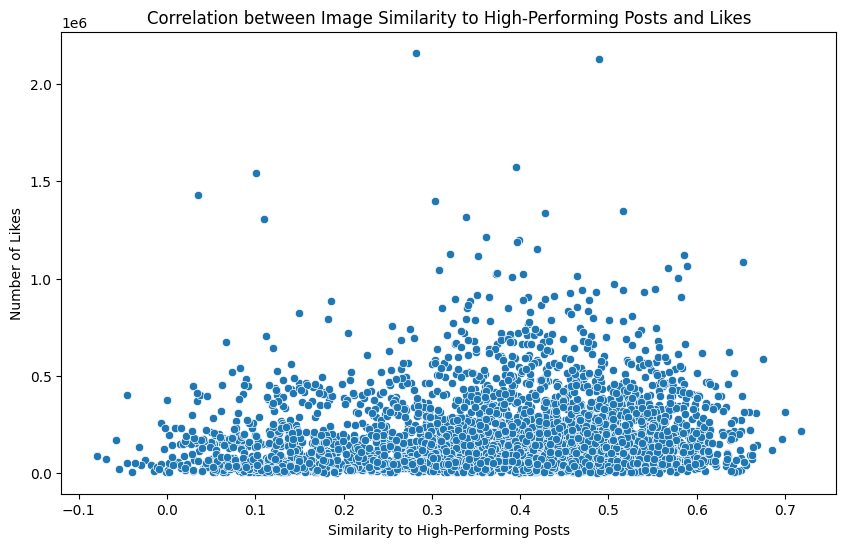

In [100]:
# Calculate average feature values for high-performing posts
high_likes = df[df['like_category'] == 2]['image_features'].mean()

# Calculate correlation between each post's features and high-performing features
df['high_like_similarity'] = df['image_features'].apply(lambda x: np.corrcoef(x, high_likes)[0, 1])

plt.figure(figsize=(10, 6))
sns.scatterplot(x='high_like_similarity', y='likes', data=df)
plt.title('Correlation between Image Similarity to High-Performing Posts and Likes')
plt.xlabel('Similarity to High-Performing Posts')
plt.ylabel('Number of Likes')
plt.show()

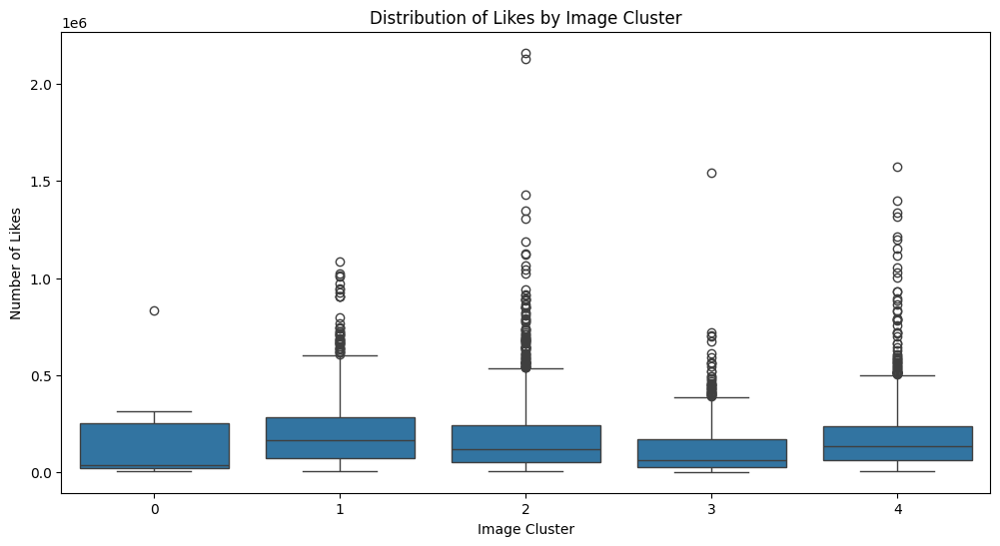

In [101]:
from sklearn.cluster import KMeans

# Perform K-means clustering on image features
kmeans = KMeans(n_clusters=5, random_state=42)
df['image_cluster'] = kmeans.fit_predict(df['image_features'].tolist())

# Visualize likes distribution for each cluster
plt.figure(figsize=(12, 6))
sns.boxplot(x='image_cluster', y='likes', data=df)
plt.title('Distribution of Likes by Image Cluster')
plt.xlabel('Image Cluster')
plt.ylabel('Number of Likes')
plt.show()

## Image Features Analysis

<Figure size 1500x1000 with 0 Axes>

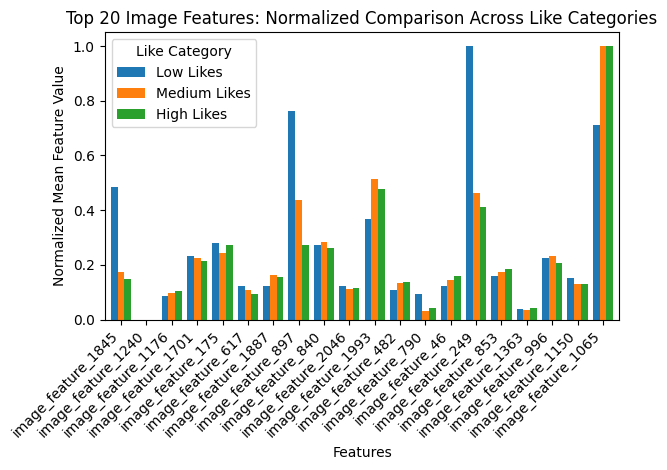

                    Low Likes  Medium Likes  High Likes
image_feature_1845   0.483841      0.175020    0.148342
image_feature_1240   0.000000      0.000000    0.000000
image_feature_1176   0.087084      0.098284    0.102450
image_feature_1701   0.230887      0.226648    0.214557
image_feature_175    0.278936      0.244513    0.271328
image_feature_617    0.121121      0.107173    0.093450
image_feature_1887   0.123891      0.162838    0.157193
image_feature_897    0.761251      0.437063    0.273624
image_feature_840    0.271103      0.284100    0.260861
image_feature_2046   0.123446      0.112860    0.114917
image_feature_1993   0.367366      0.515455    0.476224
image_feature_482    0.109618      0.131791    0.138226
image_feature_790    0.091821      0.029525    0.043729
image_feature_46     0.123829      0.144660    0.159613
image_feature_249    1.000000      0.461667    0.412719
image_feature_853    0.159735      0.172654    0.183566
image_feature_1363   0.038807      0.033156    0

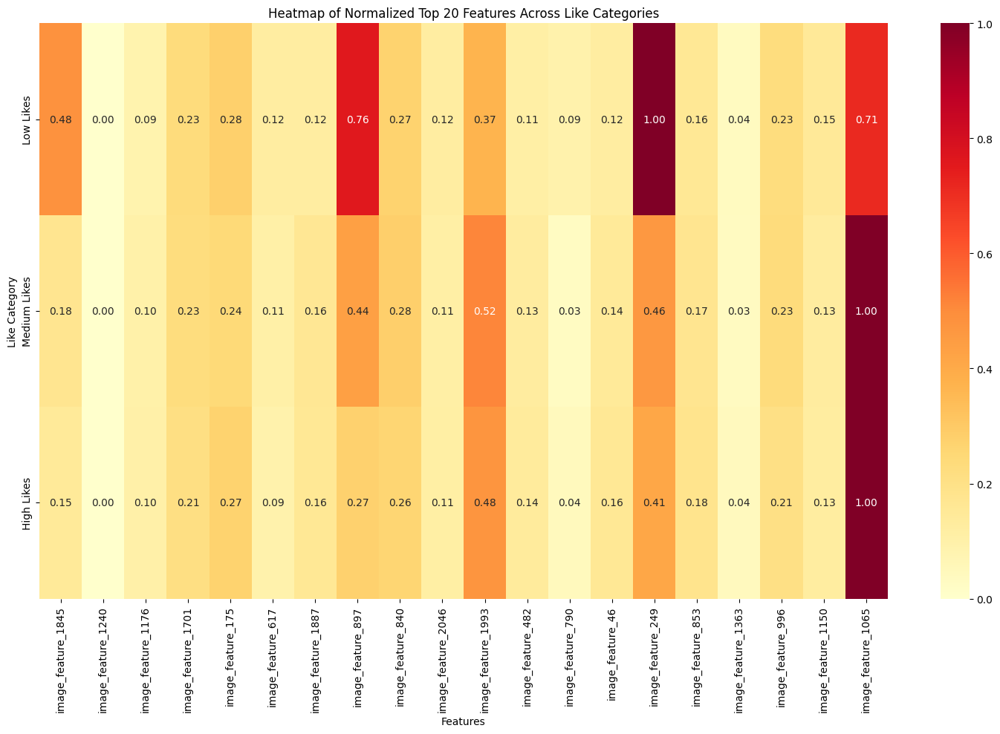

In [111]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler

# Assuming 'model' is your trained XGBClassifier and 'X' is your feature matrix

# Get feature importances
feature_importance = model.feature_importances_
feature_names = X.columns

# Create a DataFrame of feature importances
importance_df = pd.DataFrame({'feature': feature_names, 'importance': feature_importance})
importance_df = importance_df.sort_values('importance', ascending=False)

# Get top 20 features
# Remove 'no_of_comments' from the DataFrame
feature_importance_df = feature_importance_df[feature_importance_df['feature'] != 'no_of_comments']
top_20_features = feature_importance_df['feature'].head(20).tolist()

# Calculate mean feature values for each category
low_likes = X[y == 0][top_20_features].mean()
medium_likes = X[y == 1][top_20_features].mean()
high_likes = X[y == 2][top_20_features].mean()

# Combine into a DataFrame
comparison_df = pd.DataFrame({
    'Low Likes': low_likes,
    'Medium Likes': medium_likes,
    'High Likes': high_likes
})

# Normalize the data using MinMaxScaler
scaler = MinMaxScaler()
normalized_df = pd.DataFrame(scaler.fit_transform(comparison_df), 
                             columns=comparison_df.columns, 
                             index=comparison_df.index)

# Plot the normalized comparison
plt.figure(figsize=(15, 10))
normalized_df.plot(kind='bar', width=0.8)
plt.title('Top 20 Image Features: Normalized Comparison Across Like Categories')
plt.xlabel('Features')
plt.ylabel('Normalized Mean Feature Value')
plt.legend(title='Like Category')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Print the normalized numerical values
print(normalized_df)

# Optional: Plot heatmap for better visualization
plt.figure(figsize=(15, 10))
sns.heatmap(normalized_df.T, annot=True, cmap='YlOrRd', fmt='.2f')
plt.title('Heatmap of Normalized Top 20 Features Across Like Categories')
plt.ylabel('Like Category')
plt.xlabel('Features')
plt.tight_layout()
plt.show()

<Figure size 1500x1000 with 0 Axes>

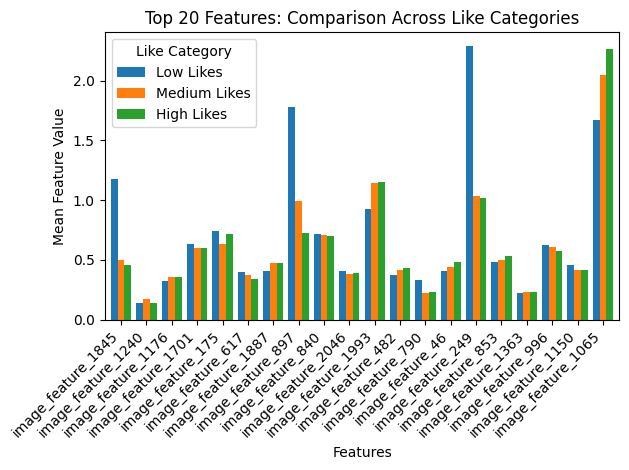

                    Low Likes  Medium Likes  High Likes
image_feature_1845   1.178964      0.499521    0.456734
image_feature_1240   0.136327      0.170311    0.141435
image_feature_1176   0.323986      0.355182    0.359191
image_feature_1701   0.633868      0.596633    0.597472
image_feature_175    0.737410      0.630237    0.718138
image_feature_617    0.397332      0.371902    0.340060
image_feature_1887   0.403302      0.476608    0.475545
image_feature_897    1.776757      0.992421    0.723018
image_feature_840    0.720531      0.704700    0.695890
image_feature_2046   0.402342      0.382600    0.385688
image_feature_1993   0.927971      1.139876    1.153640
image_feature_482    0.372546      0.418209    0.435232
image_feature_790    0.334193      0.225846    0.234380
image_feature_46     0.403169      0.442414    0.480688
image_feature_249    2.291242      1.038701    1.018661
image_feature_853    0.480542      0.495071    0.531602
image_feature_1363   0.219953      0.232677    0

In [112]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming 'model' is your trained XGBClassifier and 'X' is your feature matrix

# Get feature importances
feature_importance = model.feature_importances_
feature_names = X.columns

# Create a DataFrame of feature importances
importance_df = pd.DataFrame({'feature': feature_names, 'importance': feature_importance})
importance_df = importance_df.sort_values('importance', ascending=False)


# Remove 'no_of_comments' from the DataFrame
feature_importance_df = feature_importance_df[feature_importance_df['feature'] != 'no_of_comments']
top_20_features = feature_importance_df['feature'].head(20).tolist()
# Calculate mean feature values for each category
low_likes = X[y == 0][top_20_features].mean()
medium_likes = X[y == 1][top_20_features].mean()
high_likes = X[y == 2][top_20_features].mean()

# Combine into a DataFrame
comparison_df = pd.DataFrame({
    'Low Likes': low_likes,
    'Medium Likes': medium_likes,
    'High Likes': high_likes
})

# Plot the comparison
plt.figure(figsize=(15, 10))
comparison_df.plot(kind='bar', width=0.8)
plt.title('Top 20 Features: Comparison Across Like Categories')
plt.xlabel('Features')
plt.ylabel('Mean Feature Value')
plt.legend(title='Like Category')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Print the numerical values
print(comparison_df)

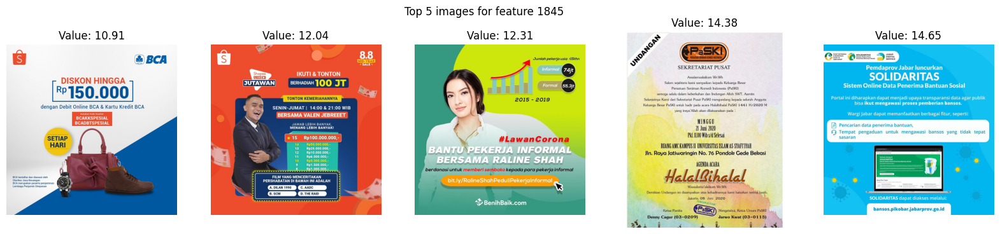

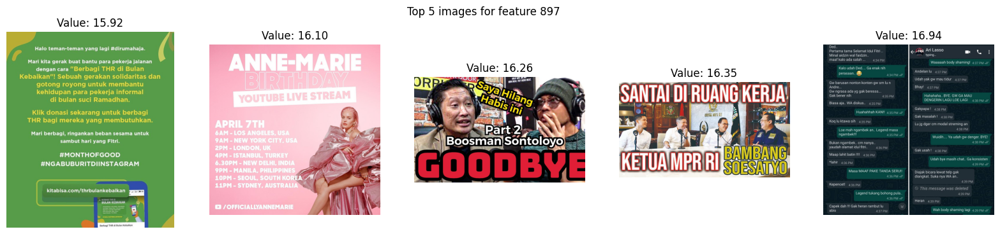

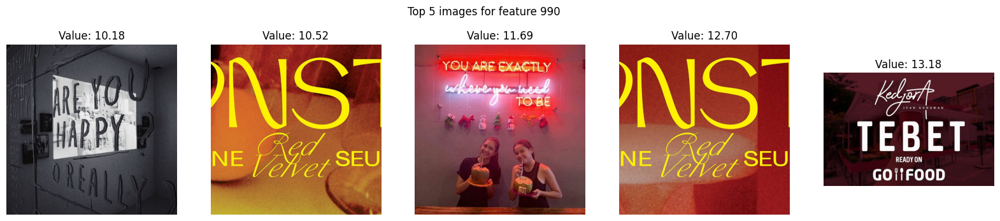

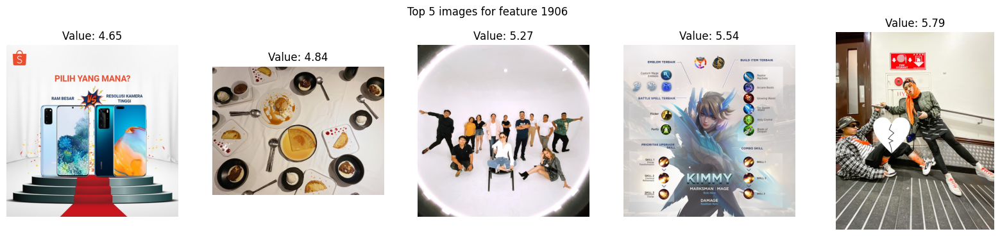

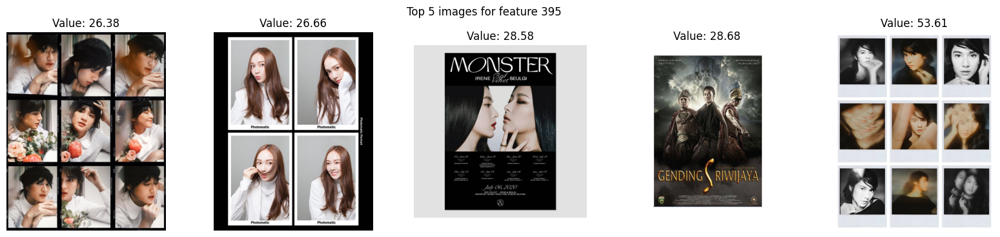

In [105]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Define the base path for the images
BASE_PATH = "/Users/scottwang/Desktop/Interview mini project/Interview Dec 2023"

def visualize_feature(feature_index, top_n=5):
    # Get the feature values for all images
    feature_values = np.array([features[feature_index] for features in df['image_features']])
    
    # Find the indices of the top N images that activate this feature
    top_indices = np.argsort(feature_values)[-top_n:]
    
    # Display these images
    fig, axes = plt.subplots(1, top_n, figsize=(20, 4))
    for i, idx in enumerate(top_indices):
        # Get only the filename from the image_path
        img_filename = os.path.basename(df.iloc[idx]['image_path'])
        # Construct the full path
        img_path = os.path.join(BASE_PATH, img_filename)
        
        if os.path.exists(img_path):
            img = Image.open(img_path)
            axes[i].imshow(img)
            axes[i].axis('off')
            axes[i].set_title(f"Value: {feature_values[idx]:.2f}")
        else:
            axes[i].text(0.5, 0.5, f"Image not found:\n{img_filename}", ha='center', va='center')
            axes[i].axis('off')
    
    plt.suptitle(f"Top {top_n} images for feature {feature_index}")
    plt.show()

# Visualize the features with negative influence
negative_features = [1845, 897, 990, 1906, 395]
for feature in negative_features:
    visualize_feature(feature)

Top 5 Positive Influence Features:
['image_feature_1683', 'image_feature_1017', 'image_feature_950', 'image_feature_129', 'image_feature_85']

Top 5 Negative Influence Features:
['image_feature_395', 'image_feature_897', 'image_feature_1312', 'image_feature_1845', 'image_feature_694']

Visualizing features with high positive influence:


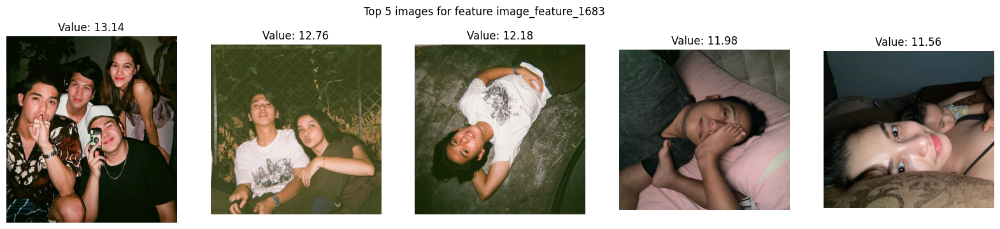

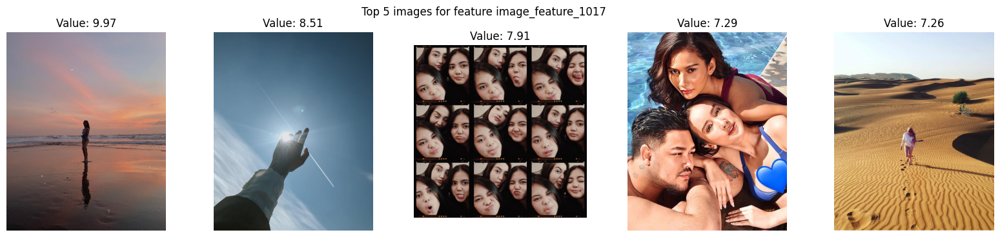

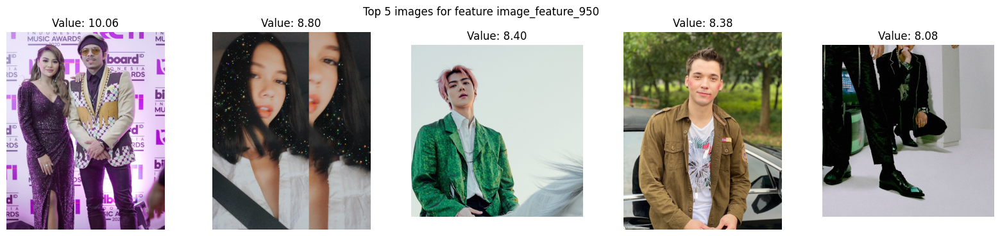

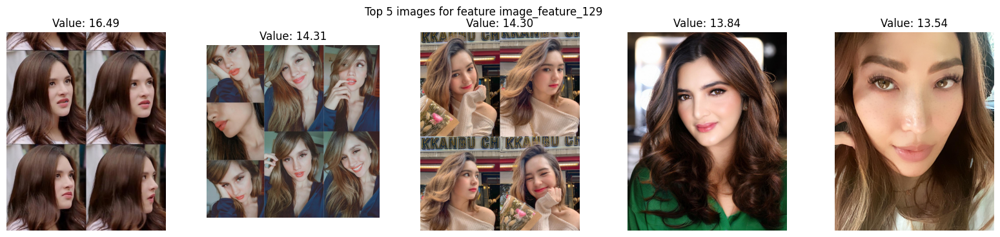

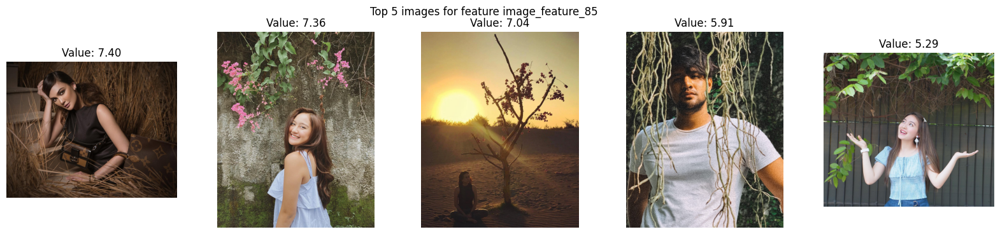


Visualizing features with negative influence:


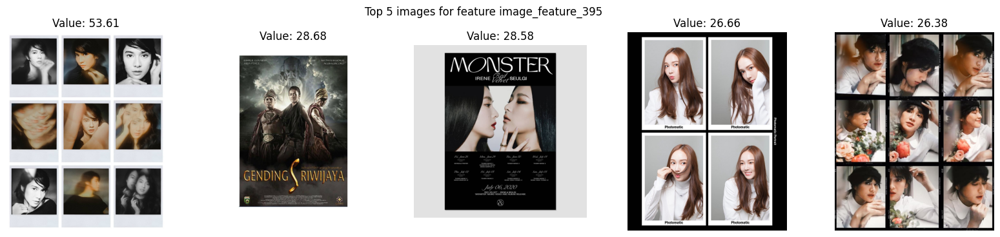

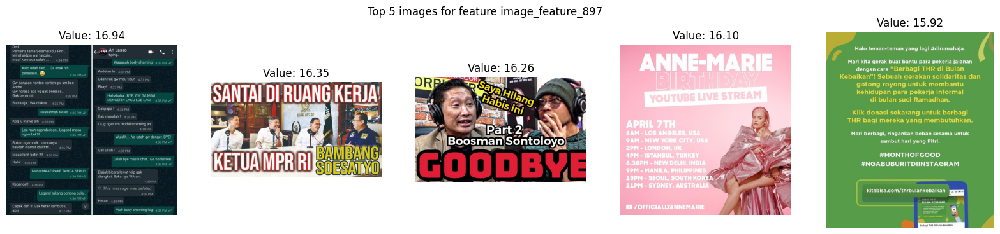

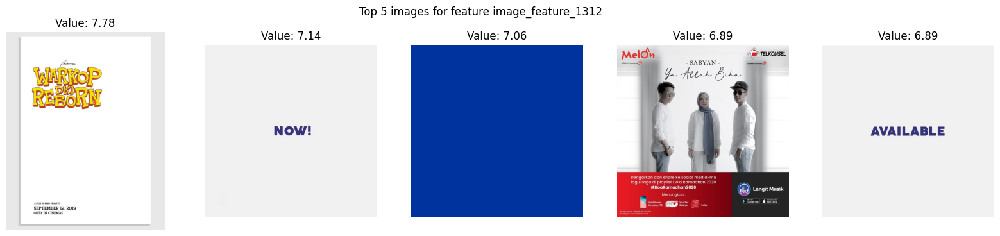

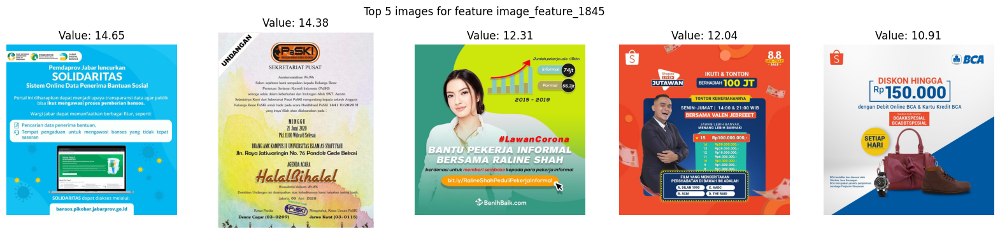

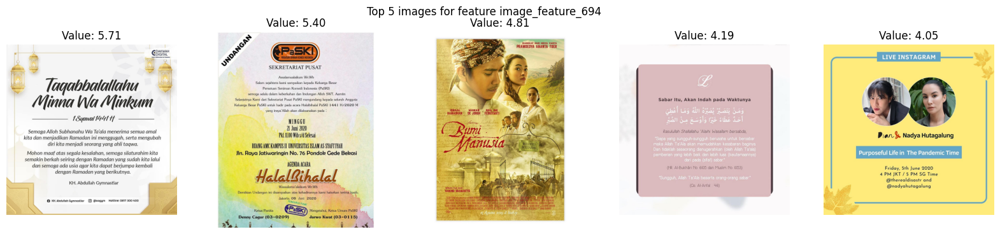


Correlations for top positive and negative features:
                    correlation
image_feature_1683     0.185147
image_feature_1017     0.157647
image_feature_950      0.152453
image_feature_129      0.150083
image_feature_85       0.148193
image_feature_395     -0.148382
image_feature_897     -0.153971
image_feature_1312    -0.156490
image_feature_1845    -0.161196
image_feature_694     -0.173713


In [106]:
import os
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
from scipy.stats import spearmanr

# Define the base path for the images
BASE_PATH = "/Users/scottwang/Desktop/Interview mini project/Interview Dec 2023"

def visualize_feature(feature_name, top_n=5):
    # Get the feature values for all images
    feature_values = df[feature_name]
    
    # Find the indices of the top N images that activate this feature
    top_indices = feature_values.nlargest(top_n).index
    
    # Display these images
    fig, axes = plt.subplots(1, top_n, figsize=(20, 4))
    for i, idx in enumerate(top_indices):
        # Get only the filename from the image_path
        img_filename = os.path.basename(df.loc[idx, 'image_path'])
        # Construct the full path
        img_path = os.path.join(BASE_PATH, img_filename)
        
        if os.path.exists(img_path):
            img = Image.open(img_path)
            axes[i].imshow(img)
            axes[i].axis('off')
            axes[i].set_title(f"Value: {feature_values[idx]:.2f}")
        else:
            axes[i].text(0.5, 0.5, f"Image not found:\n{img_filename}", ha='center', va='center')
            axes[i].axis('off')
    
    plt.suptitle(f"Top {top_n} images for feature {feature_name}")
    plt.show()

# Calculate Spearman correlation for each feature with 'like_category'
correlations = {}
for column in df.columns:
    if column.startswith('image_feature_'):
        correlation, _ = spearmanr(df[column], df['like_category'])
        correlations[column] = correlation

# Convert to DataFrame and sort
correlation_df = pd.DataFrame.from_dict(correlations, orient='index', columns=['correlation'])
correlation_df = correlation_df.sort_values('correlation', ascending=False)

# Get the top 5 positive and negative correlated features
top_positive_features = correlation_df.head(5).index.tolist()
top_negative_features = correlation_df.tail(5).index.tolist()

print("Top 5 Positive Influence Features:")
print(top_positive_features)
print("\nTop 5 Negative Influence Features:")
print(top_negative_features)

# Visualize the features with high positive influence
print("\nVisualizing features with high positive influence:")
for feature in top_positive_features:
    visualize_feature(feature)

# Visualize the features with negative influence
print("\nVisualizing features with negative influence:")
for feature in top_negative_features:
    visualize_feature(feature)



# Print correlations
print("\nCorrelations for top positive and negative features:")
print(correlation_df.loc[features_to_print])